<h1>Interior Acoustic Scattering PTR using the Representation Formula</h1>

<h3>Code Imports</h3>

In [3]:
%matplotlib inline
import sympy as sp
import numpy as np
from  sympy import cos, sin, exp
from numpy import sqrt, log
from scipy.special import hankel1
from scipy.special import jv as besselj
from scipy.linalg import toeplitz
from matplotlib import pyplot as plt
from numpy import vectorize
from mpl_toolkits.mplot3d import Axes3D

# For testing animated plots
from plotly.offline import plot, iplot, init_notebook_mode
from plotly.graph_objs import *
init_notebook_mode()
init_notebook_mode(connected=True)
from matplotlib import animation, rc
from IPython.display import HTML

<h3>Introduction</h3>

<b>Project Goals</b>
<ul> 
<li> Define the boundary and its properties
<li> From the boundary, define a function for the PTR
<li> Using equations from Kress and CKK, calculate density mu
<li> Using PTR, approximate the area outside the boundary from the function
<li> Using PTR, approximate the area inside the boundary from the function (next step)
<li> Plot PTR results
<li> Examine PTR results and error of approximate (next step)
</ul>

<h3>Variable Definitions</h3>

<img src="boundary_notes.JPG" alt="Drawing" style="width: 400px;" align="left"/>

<b> Of the Boundary</b><br>
M = Number of points on the boundary<br>
J = Jacobian<br>
τ = Tangent Vector<br>
ν = Normal Vector<br>
κ = Curvature

<b> Of the PTR Approximation</b><br>
f = Function of the density<br>
k = Wave Number<br>
μ = Density of the function on boundary<br>
x, y = Range of the outer area of boundary<br>
u = Plot of the area captured by the function

<h3>Boundary Class Definition</h3>

In [4]:
class Boundary:
    '''
    Defines the class Boundary, that contains geometric features of a boundary
    
    Attributes
    ==========
    param: parametrization of a boundary
    veloc: derivative of the parametrization
    accel: second derivative of the parametrization
    normal: normal vector to the boundary
    tangent: tangent vectors to the boundary
    curvature: signed curvature of the boundary
    jacobian: Jacobian of the boundary
    '''
    
    def __init__(self, b):
        self.y = b
    
    @property
    def yp(self):
        return [sp.diff(p, t) for p in self.y]
    @property
    def ypp(self):
        return [sp.diff(p, t) for p in self.yp]
    @property
    def J(self):
        v2 = [i**2 for i in self.yp]
        sv2 = sum(v2)
        print(sv2) # This is correct ...
        return sp.sqrt(sv2)
    @property
    def τ(self):
        return [p/self.J for p in self.yp]
    @property
    def ν(self):
        if len(self.y) == 2:
            tmp = (self.yp[1]/self.J, -self.yp[0]/self.J )
            return tmp
        else:
            raise ValueError('Need to define the normal vector for higher dimensions')
    @property
    def κ(self): #curvature kappa
        if len(self.y) == 2:
            tmp = (self.yp[0]*self.ypp[1] - self.yp[1]*self.ypp[0])/self.J**3  
            return tmp
        else:
            raise ValueError('Need to define the mean curvature for higher dimensions')
            
  #  def __call__(self, u, v):             #if one needs to call the function one can create stuff
  #      print("Hello ", self.κ)
    
  # Removed .simplify() from functions, was causing a scaling error in the values for Jacobian and Kappa

<h3>Defined Boundary Curves</h3>

In [5]:
t = sp.Symbol('t')

Ellipse = (2*cos(t), 3*sin(t))
Circle = (cos(t), sin(t))
Star = ((1+0.3*cos(5*t))*cos(t), (1+0.3*cos(5*t))*sin(t))
Kite = ((cos(t) + 0.65*cos(2*t) -0.65, 1.5*sin(t)))

E = Boundary(Ellipse)
K = Boundary(Kite)
C = Boundary(Circle)
S = Boundary(Star)

<h3>Calculation of Solution Grid</h3>

In [6]:
## Preparing values for solution grid
# κappa_E = lambda u: np.array([p.subs(t,u).evalf() for p in E.κ]).T
def makegrid(ngrid, f, xbdy, ybdy, ν, J, κ):
    
    κ_max = np.amax(np.abs(κ))  # Find the absolute maximum curvature |κ|max

    dn = (1/κ_max)/ngrid;
    rgrid = np.arange(0+dn, 1/ κ_max, dn)
    #μ = np.ones(f.shape)*4;

    # Evaluate the solutions
    x  = np.zeros((M + 1, ngrid - 1));
    y  = np.zeros((M + 1, ngrid - 1));
    v  = np.zeros((M + 1, ngrid - 1), dtype=complex); # Kernel and sum will include complex numbers
    exact  = np.zeros((M + 1, ngrid - 1), dtype=complex); # Kernel and sum will include complex numbers
    
    vB = np.sin(k * xbdy);
    grad_vB = k * np.cos(k * xbdy);
    dvB = ν[0][:] * grad_vB; # Normal derivative of vB
    for m in range(0, M):
        for n in range(0, ngrid - 1):
            x[m][n] = xbdy[m] - rgrid[n]*ν[0][m];
            y[m][n] = ybdy[m] - rgrid[n]*ν[1][m];
        
            xdiff = x[m][n] - xbdy;
            ydiff = y[m][n] - ybdy;
        
            distance = sqrt(np.power(xdiff, 2) + np.power(ydiff, 2)); #(r in kress)
            cosθ = (ν[0][:]*(x[m][n] - xbdy) + ν[1][:]*(y[m][n] - ybdy)) / distance;
            kernelD = 0.25 * 1j * (k * cosθ * hankel1(1, k*distance));
            kernelS = 0.25 * 1j * hankel1(0, k*distance); # kress (2.2+)
            #u[m][n] = np.trapz(kernel * J * μ, dx=dt);
            fx = np.sin(k*x[m][n]);
            v[m][n] = -sum(kernelD * J * vB)* dt + sum(kernelS * J * dvB) * dt;
             
            dist_ = sqrt(np.power(x[m][n] - x0, 2) + np.power(y[m][n] - y0,2));
            # w[m][n] = 0.25 * 1j * hankel1(0, k * dist_);
            exact[m][n] = np.sin(k * x[m][n]);
            
    x[M][:] = x[0][:];
    y[M][:] = y[0][:];
    v[M][:] = v[0][:];
    exact[M][:] = exact[0][:];
    return x, y, v, exact

<h3>PTR Approximation</h3>

In [7]:
# Create functions to evaluate dirichlet data
bdy_E = sp.lambdify(t, E.y);
ν_E = sp.lambdify(t, E.ν);
J_E = sp.lambdify(t, E.J);
κ_E = sp.lambdify(t, E.κ);

bdy_K = sp.lambdify(t, K.y);
ν_K = sp.lambdify(t, K.ν);
J_K = sp.lambdify(t, K.J);
κ_K = sp.lambdify(t, K.κ);

bdy_C = sp.lambdify(t, C.y);
ν_C = sp.lambdify(t, C.ν);
J_C = sp.lambdify(t, C.J);
κ_C = sp.lambdify(t, C.κ);

bdy_S = sp.lambdify(t, S.y);
ν_S = sp.lambdify(t, S.ν);
J_S = sp.lambdify(t, S.J);
κ_S = sp.lambdify(t, S.κ);

4*sin(t)**2 + 9*cos(t)**2
4*sin(t)**2 + 9*cos(t)**2
4*sin(t)**2 + 9*cos(t)**2
4*sin(t)**2 + 9*cos(t)**2
(-sin(t) - 1.3*sin(2*t))**2 + 2.25*cos(t)**2
(-sin(t) - 1.3*sin(2*t))**2 + 2.25*cos(t)**2
(-sin(t) - 1.3*sin(2*t))**2 + 2.25*cos(t)**2
(-sin(t) - 1.3*sin(2*t))**2 + 2.25*cos(t)**2
sin(t)**2 + cos(t)**2
sin(t)**2 + cos(t)**2
sin(t)**2 + cos(t)**2
sin(t)**2 + cos(t)**2
(-(0.3*cos(5*t) + 1)*sin(t) - 1.5*sin(5*t)*cos(t))**2 + ((0.3*cos(5*t) + 1)*cos(t) - 1.5*sin(t)*sin(5*t))**2
(-(0.3*cos(5*t) + 1)*sin(t) - 1.5*sin(5*t)*cos(t))**2 + ((0.3*cos(5*t) + 1)*cos(t) - 1.5*sin(t)*sin(5*t))**2
(-(0.3*cos(5*t) + 1)*sin(t) - 1.5*sin(5*t)*cos(t))**2 + ((0.3*cos(5*t) + 1)*cos(t) - 1.5*sin(t)*sin(5*t))**2
(-(0.3*cos(5*t) + 1)*sin(t) - 1.5*sin(5*t)*cos(t))**2 + ((0.3*cos(5*t) + 1)*cos(t) - 1.5*sin(t)*sin(5*t))**2


In [8]:
# Evaluate solution to hemholtz from boundary data
def def_f(bdy, x0, y0):
    xbdy = bdy[0][:];
    ybdy = bdy[1][:];
    # alpha = np.pi / 5;

    dist = sqrt(np.power(xbdy - x0, 2) + np.power(ybdy - y0, 2));

    # f = np.exp(1j * k * xbdy);
    # f = np.exp(1j * k * (np.cos(alpha) * xbdy + np.sin(alpha) * ybdy);
    # f = np.cos(k * xbdy);
    f = np.sin(k * xbdy);
    # f = 0.25 * 1j * hankel1(0, k * dist);  # Fundamental solution, Φ
    return xbdy, ybdy, f

In [9]:
# USER INPUTS:  M (number of points on boundary) and k (wave number)
M = 300
k = 4

x0 = 0;
y0 = 0;

dt = 2.0 * np.pi/(M);
θ = np.arange(0, 2* np.pi, dt);

In [10]:
xbdyE, ybdyE, fE = def_f(bdy_E(θ), x0, y0);
#fig, ax  = plt.subplots(1,1)
#ax.plot(np.real(fE), 'b', label='Real')
#ax.plot(np.imag(fE), 'r--', label='Imaginary')
#ax.legend(loc='upper right');
#fig.suptitle('Solution f of Ellipse Boundary');

In [11]:
ngrid = 99;
# μ = find_μ(fE, xbdyE, ybdyE, ν_E(θ), J_E(θ), κ_E(θ));
x, y, u, w = makegrid(ngrid, fE, xbdyE, ybdyE, ν_E(θ), J_E(θ), κ_E(θ));

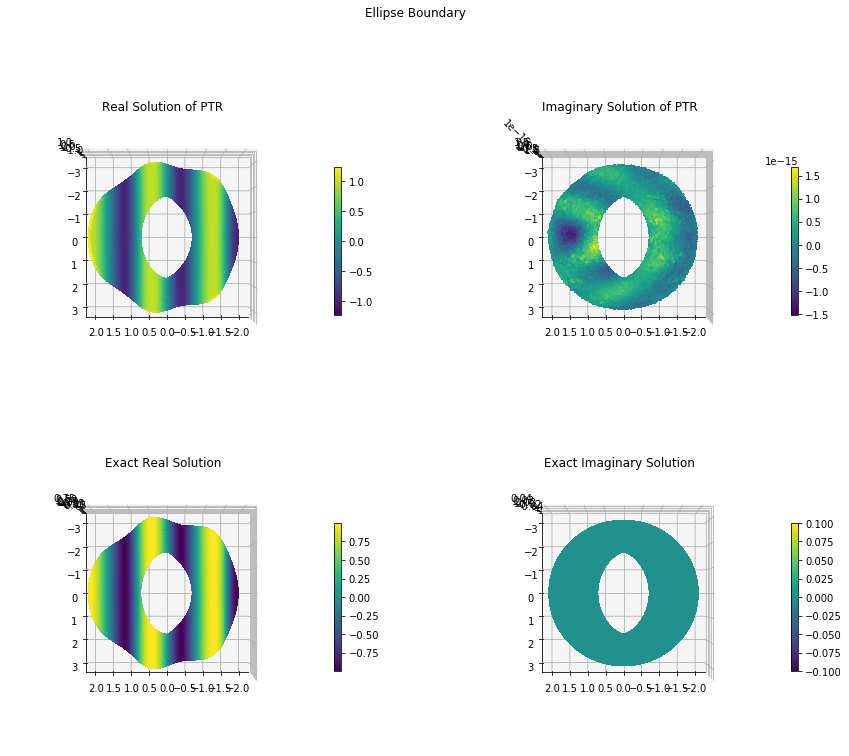

In [12]:
fig = plt.figure(figsize=(15,12))
fig.suptitle("Ellipse Boundary");
ax = fig.add_subplot(2 ,2 ,1, projection='3d')
#fig.gca(projection='3d')
ax.view_init(90,90)
real = ax.plot_surface(x, y, np.real(u), rstride=1, cstride=1, cmap=plt.get_cmap('viridis'), linewidth=0, antialiased=False)
plt.title("Real Solution of PTR");
fig.colorbar(real, shrink=0.5);


#fig = plt.figure(figsize=(10,7))
#ax = fig.gca(projection='3d')
ax = fig.add_subplot(2, 2, 2, projection='3d')
ax.view_init(90,90)
imag = ax.plot_surface(x, y, np.imag(u), rstride=1, cstride=1, cmap=plt.get_cmap('viridis'), linewidth=0, antialiased=False)
plt.title("Imaginary Solution of PTR");
fig.colorbar(imag, shrink=0.5);
#plt.show()

ax = fig.add_subplot(2, 2, 3, projection='3d')
ax.view_init(90,90)
imag = ax.plot_surface(x, y, np.real(w), rstride=1, cstride=1, cmap=plt.get_cmap('viridis'), linewidth=0, antialiased=False)
plt.title("Exact Real Solution");
fig.colorbar(imag, shrink=0.5);

ax = fig.add_subplot(2, 2, 4, projection='3d')
ax.view_init(90,90)
imag = ax.plot_surface(x, y, np.imag(w), rstride=1, cstride=1, cmap=plt.get_cmap('viridis'), linewidth=0, antialiased=False)
plt.title("Exact Imaginary Solution");
fig.colorbar(imag, shrink=0.5);



<h3>Error Plot</h3>

In [13]:
data= [Surface(x=x, y=y, z=log(np.absolute(u - w)))]

layout=dict(xaxis=dict(zeroline=False),
            yaxis=dict(zeroline=False),
            width=700,
            height=700,
            margin=dict(l=50, r=50, b=100, t=100),
           title='Log Error Plot', hovermode='closest'
           )
          
figure1=dict(data=data, layout=layout)          
iplot(figure1)

C:\Users\eange\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning:

divide by zero encountered in log



<h3>Issues (Resolved and Unresolved)</h3>
<ul>
        <li>Left Matrix Division, Matlab v. Python - Results don't seem to match,causes final results to vary extremely - <b>RESOLVED</b>, forgot to use m and n for indexes of rdiff.</li> 
    <li>3D Surface Plot - Inside of plot being filled in, need to check indexing and intervals of functions used for ngrid calculation - <b>RESOLVED</b> by imposing periodicity.</li> 
    <li>Sudden spike at the end of surface plot, missing gap of data. Need to check theta range and impose periodicity - <b>RESOLVED</b> by imposing periodicity.</li>
    <li>Tested results for Star boundary, plot not giving expected results.  Need to check density calculation for possible restriction in current code.  L2 and M2's real parts are not correct (Kappa values appear incorrect... need to check calculation of for Star's derivatives, compare) - <b>RESOLVED</b> by removing .simplify() function.
    <li>Seems to be disparity between u plot and w plot, resulting in weird error display.  Need to find why gap exists (wplot is accurate) - <b>RESOLVED</b> by imposing periodicity AFTER calculations of x, y, u, and w ... not BEFORE by including 2pi in theta, and by using SUM method instead of trapz.</li>
</ul>